#**PREPROCESAMIENTO DEL DATASET ECOSIGHT**

In [ ]:
from PIL import Image
import os

def redimensionar_imagenes(carpeta_origen, carpeta_destino, tamaño=(640, 640)):
    os.makedirs(carpeta_destino, exist_ok=True)
    for nombre_archivo in os.listdir(carpeta_origen):
        if nombre_archivo.endswith('.jpg'):
            ruta_imagen = os.path.join(carpeta_origen, nombre_archivo)
            with Image.open(ruta_imagen) as img:
                img.resize(tamaño).save(os.path.join(carpeta_destino, nombre_archivo))
                print(f"Imagen {nombre_archivo} redimensionada y guardada en {os.path.join(carpeta_destino, nombre_archivo)}")

def procesar_clases():
    clases = {
        'pet_plastic': ('Origen/pet_plastic', 'Fin/pet_plastic'),
        'hard_plastic': ('Origen/hard_plastic', 'Fin/hard_plastic'),
        'paper': ('Origen/paper', 'Fin/paper'),
        'cardboard': ('Origen/cardboard', 'Fin/cardboard'),
    }

    for carpeta_origen, carpeta_destino in clases.values():
        redimensionar_imagenes(carpeta_origen, carpeta_destino)

procesar_clases()
print("Imágenes han sido redimensionadas.")


#**ENTRENAMIENTO DEL MODELO HUYOLO-NAS**

#**Paso 01: Instalación de los paquetes**

In [ ]:
%%capture
!pip install -U git+https://github.com/Deci-AI/super-gradients
!pip install albumentations==1.3.0
!pip install imutils
!pip install roboflow
!pip install pytube
!pip install supervision
!pip install onemetric

#**Paso 02: Importar todas las bibliotecas necesarias**

In [ ]:
from super_gradients import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

The console stream is logged into /root/sg_logs/console.log


[2024-11-13 17:29:33] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-11-13 17:29:44] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-11-13 17:29:48] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command


In [ ]:
from IPython.display import clear_output

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

In [ ]:
from super_gradients.training import models

#**Paso 03: Establecer el directorio del punto de control y el nombre del experimento | Instancia del entrenamiento**

In [ ]:
CHECKPOINT_DIR = 'checkpoints2'
trainer = Trainer(experiment_name='sign_yolonas_run2', ckpt_root_dir=CHECKPOINT_DIR)

#**Paso 04: Exportación del dataset de Roboflow a Google Colab Notebook**

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="x1PBscLZdQSRI8JTiJR1")
project = rf.workspace("holonas").project("huyolo-nas-m9nj5")
version = project.version(6)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


#**Paso 05: Cargar los parámetros del conjunto de datos en un diccionario**




Tendrá que cargar los parámetros de su conjunto de datos en un diccionario, definiendo específicamente:

- La ruta al directorio principal donde se encuentran los datos
- Los nombres de los directorios hijos para las imágenes y etiquetas de entrenamiento, validación y prueba (si tiene un conjunto de pruebas)
- Nombres de clases

In [ ]:
dataset_params = {
    'data_dir':'/content/HuYOLO-NAS-6',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['cardboard', 'hard_plastic', 'paper','pet_plastic']
}

#**Paso 06: Pasar los valores de `dataset_params` al argumento `dataset_params`**

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

[2024-11-13 17:32:04] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 7800/7800 [00:01<00:00, 7241.04it/s]
[2024-11-13 17:32:05] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 200/200 [00:00<00:00, 6925.35it/s]
[2024-11-13 17:32:05] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 400/400 [00:00<00:00, 6812.92it/s]


#**Paso 07: Inspeccionar el conjunto de datos definido anteriormente**

In [ ]:
train_data.dataset.transforms

In [ ]:
train_data.dataset.dataset_params['transforms'][1]

{'DetectionRandomAffine': {'degrees': 10.0, 'translate': 0.1, 'scales': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'filter_box_candidates': True, 'wh_thr': 2, 'area_thr': 0.1, 'ar_thr': 20}}

In [ ]:
train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10

#**Paso 08: Trazar un lote de datos de entrenamiento con sus aumentos aplicados para ver qué aspecto tienen**

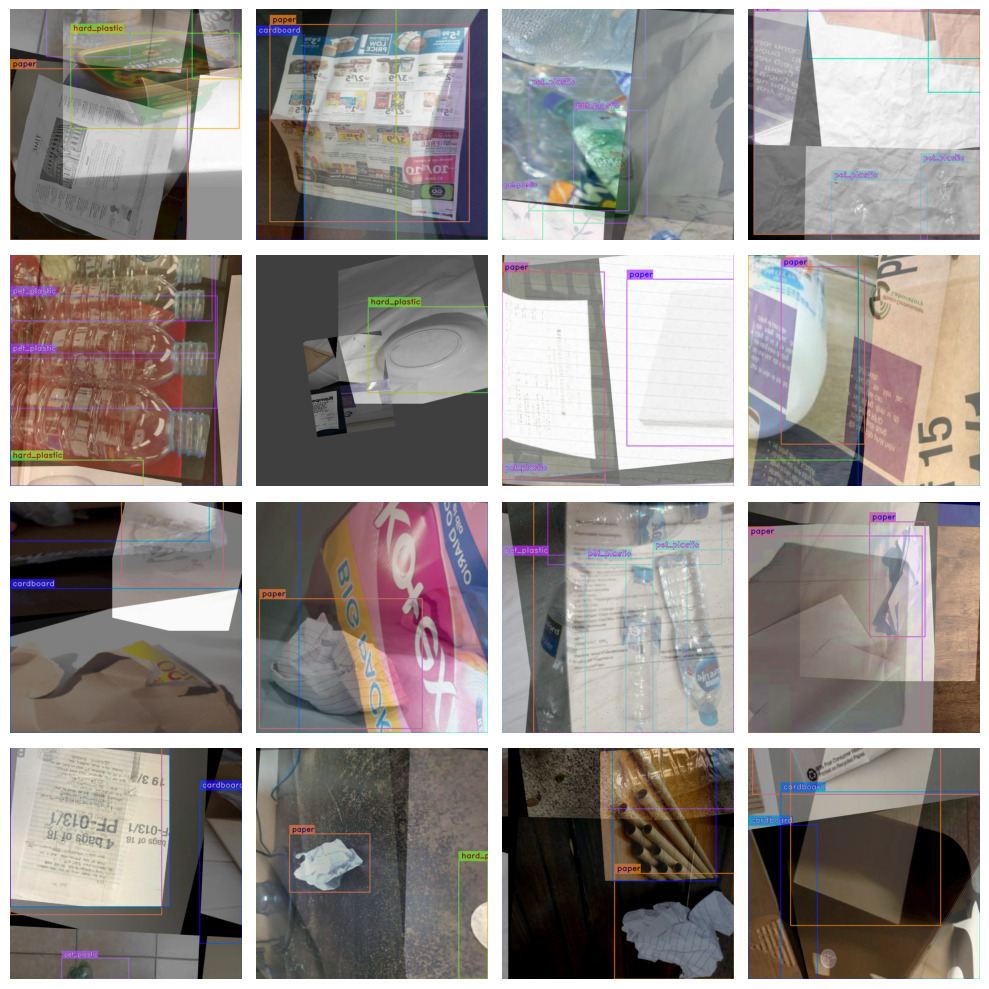

In [ ]:
train_data.dataset.plot()

#**Paso 09: Creación del modelo**


Ya hemos visto cómo instanciar el modelo para la inferencia.

A continuación se muestra cómo instanciar el modelo para « finetuning ». Tenga en cuenta que usted necesita para agregar el argumento `num_classes` aquí.

Nota, para este proyecto estamos utilizando `yolo_nas_s`, pero SuperGradients tiene otros dos modelos de YOLONAS disponibles : `yolo_nas_m` y `yolo_nas_l`.

Al ejecutar dara un error, debe abrirse el archivo /usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/checkpoint_utils.py  y reemplazar la linea 1592 por esta: "unique_filename = url.split(https://sg-hub-nv.s3.amazonaws.com")[1].replace("/", "_").replace(" ", "_")"

Luego reiniciar el entorno de ejecución para que se cargue el archivo.

In [ ]:
model = models.get('yolo_nas_s',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2024-11-13 17:32:08] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-11-13 17:32:08] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sg-hub-nv.s3.amazonaws.com/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/_models_yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:05<00:00, 13.0MB/s]
[2024-11-13 17:

#**Paso 10: Definir métricas y parámetros de entrenamiento.**





Tenemos que definir los parámetros de entrenamiento para su entrenamiento.

[FUENTE](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/training_hyperparams/default_train_params.yaml).


### Hay argumentos **obligatorios** que debemos definir para los parámetros de entrenamiento

- `max_epochs` - Número máximo de épocas de entrenamiento

- `loss` - La función de pérdida que desea utilizar

- `optimizer` - Optimizador que va a utilizar

- `train_metrics_list` - Métricas a registrar durante el entrenamiento

- `valid_metrics_list` - Métricas a registrar durante el entrenamiento

- `metric_to_watch` - Métrica según la cual se guardará el punto de control del modelo

Podemos elegir entre una variedad de `optimizadores` como: Adam, AdamW, SGD, Lion, o RMSProps. Si decide cambiar los parámetros defualt de estos optimizrs que pasar en `optimizer_params`.


In [ ]:
train_params = {
    'silent_mode': True,
    "average_best_models":True,
    "warmup_mode": "LinearEpochLRWarmup",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 2e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.3,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay":  0.001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 20,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.5,
            top_k_predictions=50,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.5,
                nms_top_k=30,
                max_predictions=30,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

#**Paso 11: Entrenamiento del modelo**

Entrenar un modelo usando un SuperGradiente se hace usando el `trainer`.

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

[2024-11-13 17:32:15] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20241113_173215_803580`
[2024-11-13 17:32:15] INFO - sg_trainer.py - Checkpoints directory: checkpoints2/sign_yolonas_run2/RUN_20241113_173215_803580
[2024-11-13 17:32:15] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to checkpoints2/sign_yolonas_run2/RUN_20241113_173215_803580/console_Nov13_17_32_15.txt


`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
[2024-11-13 17:32:22] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            7800       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         487        (len(train_loader))
    - Gradient updates per epoch:   487        (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_S  (19.02M parameters, 19.02M optimized)
    - Learning Rates and Weight Decays:
      - default: (19.02M parameters). LR: 0.0002 (19.02M parameters) WD: 0.0, (42.14K p

#**Paso 12: Monitoreo del entrenamiento del modelo en Tensorboard**#

In [ ]:
CHECKPOINT_DIR = '/content/checkpoints2'  # Ruta donde se guardan los checkpoints
experiment_name= 'sign_yolonas_run2'  # Nombre del experimento

%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{experiment_name}

In [ ]:
import pandas as pd
from tensorboard.backend.event_processing import event_accumulator
import os

CHECKPOINT_DIR = '/content/checkpoints2'
experiment_name = 'sign_yolonas_run2'
log_dir = f"{CHECKPOINT_DIR}/{experiment_name}"

csv_dir = "/content/tensorboard_csvs"
os.makedirs(csv_dir, exist_ok=True)

for root, dirs, files in os.walk(log_dir):
    for file in files:
        if file.startswith("events.out"):
            event_path = os.path.join(root, file)
            ea = event_accumulator.EventAccumulator(event_path)
            ea.Reload()
            if "scalars" in ea.Tags():
                for tag in ea.Tags()["scalars"]:
                    events = ea.Scalars(tag)
                    df = pd.DataFrame([(e.wall_time, e.step, e.value) for e in events],
                                      columns=["wall_time", "step", "value"])
                    sanitized_tag = tag.replace('/', '_').replace('@', '_').replace('.', '_')
                    csv_file = os.path.join(csv_dir, f"{sanitized_tag}.csv")
                    df.to_csv(csv_file, index=False)
                    print(f"Guardado: {csv_file}")
from google.colab import files
for csv_file in os.listdir(csv_dir):
    files.download(os.path.join(csv_dir, csv_file))


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Guardado: /content/tensorboard_csvs/System_disk_usage_percent.csv
Guardado: /content/tensorboard_csvs/System_disk_io_write_mbs.csv
Guardado: /content/tensorboard_csvs/System_disk_io_read_mbs.csv
Guardado: /content/tensorboard_csvs/System_memory_usage_percent.csv
Guardado: /content/tensorboard_csvs/System_network_network_sent_mbs.csv
Guardado: /content/tensorboard_csvs/System_network_network_recv_mbs.csv
Guardado: /content/tensorboard_csvs/System_cpu_usage_percent.csv
Guardado: /content/tensorboard_csvs/System_gpu_memory_usage_percent_device_0.csv
Guardado: /content/tensorboard_csvs/System_gpu_memory_allocated_percent_device_0.csv
Guardado: /content/tensorboard_csvs/System_gpu_usage_percent_device_0.csv
Guardado: /content/tensorboard_csvs/train_inference_time.csv
Guardado: /content/tensorboard_csvs/train_ppyoloeloss_loss_cls.csv
Guardado: /content/tensorboard_csvs/train_ppyoloeloss_loss_iou.csv
Guardado: /content/tensorboard_csvs/train_ppyoloeloss_loss_dfl.csv
Guardado: /content/tensorb

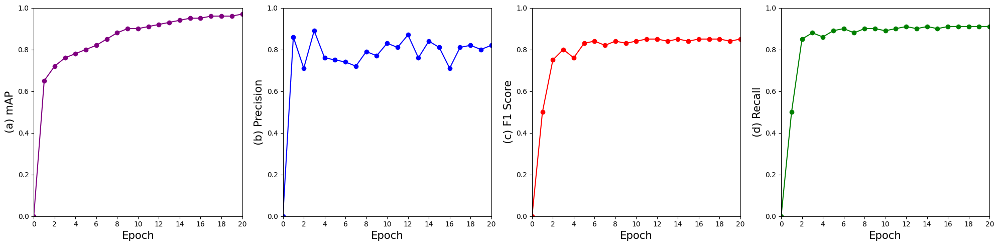

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

epochs = np.arange(0, 21)

metrics = {
    "(a) mAP": [
        0.00, 0.65, 0.72, 0.76, 0.78, 0.80,
        0.82, 0.85, 0.88, 0.90, 0.90, 0.91,
        0.92, 0.93, 0.94, 0.95, 0.95, 0.96,
        0.96, 0.96, 0.97
    ],
    "(b) Precision": [
        0.00, 0.86, 0.71, 0.89, 0.76,
        0.75, 0.74, 0.72, 0.79, 0.77,
        0.83, 0.81, 0.87, 0.76, 0.84,
        0.81, 0.71, 0.81, 0.82, 0.80,
        0.82
    ],
    "(c) F1 Score": [
        0.00, 0.50, 0.75, 0.80, 0.76, 0.83,
        0.84, 0.82, 0.84, 0.83, 0.84,
        0.85, 0.85, 0.84, 0.85, 0.84,
        0.85, 0.85, 0.85, 0.84, 0.85
    ],
    "(d) Recall": [
        0.00, 0.50, 0.85, 0.88, 0.86, 0.89,
        0.90, 0.88, 0.90, 0.90, 0.89,
        0.90, 0.91, 0.90, 0.91, 0.90,
        0.91, 0.91, 0.91, 0.91, 0.91
    ]
}

colors = {
    "(a) mAP": "purple",
    "(b) Precision": "blue",
    "(c) F1 Score": "red",
    "(d) Recall": "green"
}

fig, axs = plt.subplots(1, 4, figsize=(20, 5))

font_size = 9
scaled_font_size = font_size * 1.7

for ax, (metric_name, values) in zip(axs, metrics.items()):
    ax.plot(range(len(values)), values, marker='o', color=colors[metric_name])
    ax.set_ylabel(metric_name, fontsize=scaled_font_size)
    ax.set_xlabel("Epoch", fontsize=scaled_font_size)
    ax.set_xlim(0, 20)
    ax.set_ylim(0, 1)
    ax.set_xticks(np.arange(0, 21, 2))
    ax.grid(False)
plt.tight_layout()
fig.savefig('/content/metrics_plot.svg', format='svg')
plt.show()


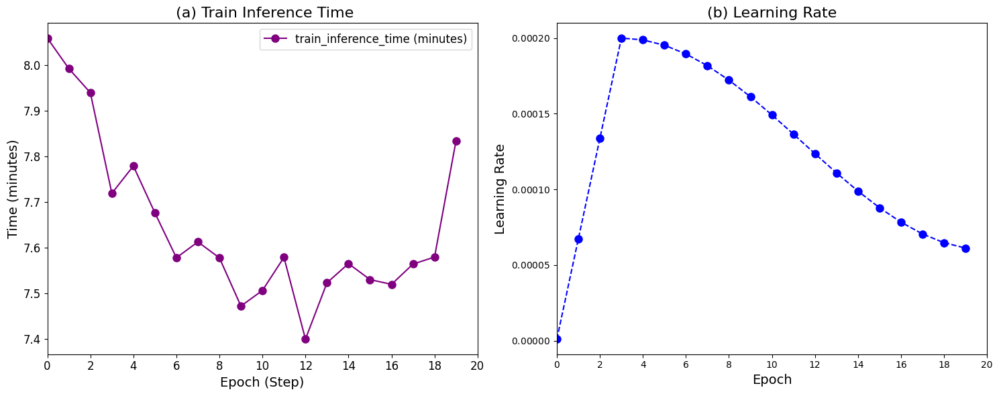

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, ScalarFormatter, MultipleLocator

train_step = np.arange(0, 20)
train_value_seconds = [
    483552.71875, 479540.9375, 476370.8125, 463133.6875, 466733.375, 460572.65625, 454662.6875, 456743.9375,
    454650.5, 448302.46875, 450360.0625, 454712.59375, 443953.59375, 451369.0, 453889.625, 451791.0625,
    451158.65625, 453831.6875, 454749.4375, 470056.5625
]

train_value_hours = np.array(train_value_seconds) / 3_600_000  # Convertir de milisegundos a horas

train_value_minutes = train_value_hours * 60  # Convertir horas a minutos

delr_value = [
    9.999999974752427e-07, 6.733333430020139e-05, 0.0001336666609859094, 0.00019999999494757503, 0.0001988132717087865,
    0.00019528377742972225, 0.0001895316381705925, 0.00018175272271037102, 0.00017221184680238366,
    0.00016123385285027325, 0.00014919247769284993, 0.00013649767788592726, 0.00012358165986370295,
    0.00011088416795246303, 9.883748134598136e-05, 8.785173849901184e-05, 7.830096001271158e-05,
    7.051030843285844e-05, 6.474502151831985e-05, 6.120137550169602e-05
]

fig, axs = plt.subplots(1, 2, figsize=(15, 6))  # 1 fila, 2 columnas

axs[0].plot(train_step, train_value_minutes, label="train_inference_time (minutes)", marker='o', color='purple', linestyle='-', markersize=8)
axs[0].set_xlabel("Epoch (Step)", fontsize=14)
axs[0].set_ylabel("Time (minutes)", fontsize=14)
axs[0].set_title(" (a) Train Inference Time", fontsize=16)
axs[0].tick_params(axis='both', which='major', labelsize=12)
axs[0].legend(fontsize=12)

axs[1].plot(train_step, delr_value, label="delr_default", marker='o', color='blue', linestyle='--', markersize=8)
axs[1].set_xlabel("Epoch", fontsize=14)
axs[1].set_ylabel("Learning Rate", fontsize=14)
axs[1].set_title("(b) Learning Rate", fontsize=16)

axs[0].xaxis.set_major_locator(MultipleLocator(2))
axs[1].xaxis.set_major_locator(MultipleLocator(2))
axs[0].set_xlim(0, 20)
axs[1].set_xlim(0, 20)
axs[0].xaxis.set_major_locator(MaxNLocator(integer=True))
axs[1].xaxis.set_major_locator(MaxNLocator(integer=True))
axs[1].yaxis.set_major_formatter(ScalarFormatter(useMathText=True)
axs[1].yaxis.set_major_locator(MaxNLocator(integer=True, prune='lower', nbins=5))
plt.tight_layout()
plt.savefig('/content/learning_rate_inference_time.svg', format='svg')
plt.show()


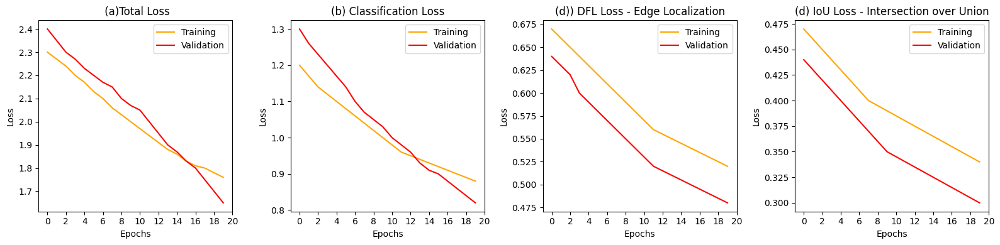

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
epochs = np.arange(0, 20, 1)

train_loss = [2.3, 2.27, 2.24, 2.2, 2.17, 2.13, 2.1, 2.06, 2.03, 2.0, 1.97, 1.94, 1.91, 1.88, 1.86, 1.83, 1.81, 1.8, 1.78, 1.76]
valid_loss = [2.4, 2.35, 2.3, 2.27, 2.23, 2.2, 2.17, 2.15, 2.1, 2.07, 2.05, 2.0, 1.95, 1.9, 1.87, 1.83, 1.8, 1.75, 1.7, 1.65]

train_loss_cls = [1.2, 1.17, 1.14, 1.12, 1.1, 1.08, 1.06, 1.04, 1.02, 1.0, 0.98, 0.96, 0.95, 0.94, 0.93, 0.92, 0.91, 0.9, 0.89, 0.88]
valid_loss_cls = [1.3, 1.26, 1.23, 1.2, 1.17, 1.14, 1.1, 1.07, 1.05, 1.03, 1.0, 0.98, 0.96, 0.93, 0.91, 0.9, 0.88, 0.86, 0.84, 0.82]

train_loss_dfl = [0.67, 0.66, 0.65, 0.64, 0.63, 0.62, 0.61, 0.6, 0.59, 0.58, 0.57, 0.56, 0.555, 0.55, 0.545, 0.54, 0.535, 0.53, 0.525, 0.52]
valid_loss_dfl = [0.64, 0.63, 0.62, 0.6, 0.59, 0.58, 0.57, 0.56, 0.55, 0.54, 0.53, 0.52, 0.515, 0.51, 0.505, 0.5, 0.495, 0.49, 0.485, 0.48]

train_loss_iou = [0.47, 0.46, 0.45, 0.44, 0.43, 0.42, 0.41, 0.4, 0.395, 0.39, 0.385, 0.38, 0.375, 0.37, 0.365, 0.36, 0.355, 0.35, 0.345, 0.34]
valid_loss_iou = [0.44, 0.43, 0.42, 0.41, 0.4, 0.39, 0.38, 0.37, 0.36, 0.35, 0.345, 0.34, 0.335, 0.33, 0.325, 0.32, 0.315, 0.31, 0.305, 0.3]

fig, axs = plt.subplots(1, 4, figsize=(16, 4))

axs[0].plot(epochs, train_loss, label='Training', color='orange')
axs[0].plot(epochs, valid_loss, label='Validation', color='red')
axs[0].set_title(" (a)Total Loss")
axs[0].set_xlabel("Epochs")
axs[0].set_ylabel("Loss")
axs[0].legend()
axs[0].set_xticks(np.arange(0, 21, 2))

axs[1].plot(epochs, train_loss_cls, label='Training', color='orange')
axs[1].plot(epochs, valid_loss_cls, label='Validation', color='red')
axs[1].set_title("(b) Classification Loss")
axs[1].set_xlabel("Epochs")
axs[1].set_ylabel("Loss")
axs[1].legend()
axs[1].set_xticks(np.arange(0, 21, 2))
axs[2].plot(epochs, train_loss_dfl, label='Training', color='orange')
axs[2].plot(epochs, valid_loss_dfl, label='Validation', color='red')
axs[2].set_title("(d)) DFL Loss - Edge Localization")
axs[2].set_xlabel("Epochs")
axs[2].set_ylabel("Loss")
axs[2].legend()
axs[2].set_xticks(np.arange(0, 21, 2))

axs[3].plot(epochs, train_loss_iou, label='Training', color='orange')
axs[3].plot(epochs, valid_loss_iou, label='Validation', color='red')
axs[3].set_title("(d) IoU Loss - Intersection over Union")
axs[3].set_xlabel("Epochs")
axs[3].set_ylabel("Loss")
axs[3].legend()
axs[3].set_xticks(np.arange(0, 21, 2))

plt.tight_layout()
plt.savefig("loss_comparison.svg", format="svg")
plt.show()


#**Paso 13: Establecer UTF-8 como codificación por defecto en Python**#

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

#**Paso 14: Comprimir y descargar el modelo ajustado**#

In [ ]:
!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{experiment_name}

  adding: content/checkpoints2/sign_yolonas_run2/ (stored 0%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/ (stored 0%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/console_Nov06_14_06_20.txt (deflated 76%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/logs_Nov06_14_06_20.txt (deflated 78%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/average_model.pth (deflated 8%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/events.out.tfevents.1730909049.6107311e8c9a.3162.1 (deflated 43%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/experiment_logs_Nov06_14_06_20.txt (deflated 74%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/ckpt_latest.pth (deflated 8%)
  adding: content/checkpoints2/sign_yolonas_run2/RUN_20241106_140620_186106/events.out.tfevents.1730901980.6107311e8c9a.3162.0 (deflat

#**Paso 15: Obtener el mejor modelo entrenado.**

In [ ]:
best_model = models.get('yolo_nas_s',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/checkpoints2/sign_yolonas_run2/RUN_20241113_173215_803580/ckpt_best.pth")

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


#**Paso 16: Evaluar el mejor modelo entrenado en el conjunto de prueba**

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.5,
        top_k_predictions=50,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.5,
            nms_top_k=30,
            max_predictions=30,
            nms_threshold=0.7
        )
    )
)

Testing:  96%|█████████▌| 24/25 [00:12<00:00,  2.40it/s]

{'PPYoloELoss/loss_cls': 0.7642916,
 'PPYoloELoss/loss_iou': 0.2895403,
 'PPYoloELoss/loss_dfl': 0.4555394,
 'PPYoloELoss/loss': 1.5093713,
 'Precision@0.50': 0.7729302644729614,
 'Recall@0.50': 0.9444869756698608,
 'mAP@0.50': 0.932045578956604,
 'F1@0.50': 0.8374061584472656,
 'Best_score_threshold': 0.7400000095367432}

#**Paso 17: Inferencia con modelo entrenado**

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"/content/HuYOLO-NAS-6/test/images",
    annotations_directory_path=f"/content/HuYOLO-NAS-6/test/labels",
    data_yaml_path=f"/content/HuYOLO-NAS-6/data.yaml",
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_THRESHOLD = 0.5

predictions = {}

for path, image, annotation in ds:
    result = best_model.predict(image, conf=CONFIDENCE_THRESHOLD)


    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[path] = detections


[2024-11-13 20:42:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-11-13 20:42:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-11-13 20:42:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-11-13 20:42:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-11-13 20:42:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-11-13 20:42:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-11-13 20:42:12] INFO -

#**Paso 18: Visualizar los resultados de la inferencia**

In [ ]:
import random
random.seed(10)

In [ ]:
import supervision as sv
import numpy as np
import random
import cv2

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds))

indices = random.sample(range(len(ds)), n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

class_labels = ['cardboard', 'hard_plastic', 'paper', 'pet_plastic']

def clip_coordinates(coords, width, height):
    coords[:, 0] = np.clip(coords[:, 0], 0, width)
    coords[:, 1] = np.clip(coords[:, 1], 0, height)
    coords[:, 2] = np.clip(coords[:, 2], 0, width)
    coords[:, 3] = np.clip(coords[:, 3], 0, height)
    return coords

def annotate_with_labels(image, detections):
    for box, class_id in zip(detections.xyxy, detections.class_id):
        x_min, y_min, x_max, y_max = map(int, box)
        label = class_labels[class_id]
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 1, 2)[0]
        text_x = x_min + (x_max - x_min - text_size[0]) // 2
        text_y = y_min + (y_max - y_min + text_size[1]) // 2

        if text_y - text_size[1] < 0:
            text_y = y_min + text_size[1] + 5


        cv2.rectangle(image, (text_x - 5, text_y - text_size[1] - 5),
                      (text_x + text_size[0] + 5, text_y + 5), (255, 255, 255), -1)

        cv2.putText(image, label, (text_x, text_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2, cv2.LINE_AA)
    return image

for idx in indices:
    path, image, annotation = ds[idx]

    if image is not None and image.size > 0:
        height, width = image.shape[:2]
        print("Processing image:", path)
        print("Image dimensions: {}x{}".format(width, height))

        annotation.xyxy = clip_coordinates(annotation.xyxy, width, height)

        preds = predictions.get(path, sv.Detections(xyxy=np.empty((0, 4), dtype=float), confidence=np.empty((0,), dtype=float), class_id=np.empty((0,), dtype=int)))

        preds.xyxy = clip_coordinates(preds.xyxy, width, height)

        frame_with_annotations = annotate_with_labels(image.copy(), annotation)
        frame_with_predictions = annotate_with_labels(image.copy(), preds)

        images.append(frame_with_annotations)
        titles.append('Anotaciones')
        images.append(frame_with_predictions)
        titles.append('Predicciones')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))


#**Paso 18: Calcular la matriz de confusión**

Clase 0:
  Verdaderos Positivos (TP): 287.0
  Verdaderos Negativos (TN): 11.0
  Falsos Positivos (FP): 3.0
  Falsos Negativos (FN): 60.0
  Precisión: 0.9897
  Recall: 0.8271
  F1 Score: 0.9011

Clase 1:
  Verdaderos Positivos (TP): 308.0
  Verdaderos Negativos (TN): 43.0
  Falsos Positivos (FP): 8.0
  Falsos Negativos (FN): 2.0
  Precisión: 0.9747
  Recall: 0.9935
  F1 Score: 0.9840

Clase 2:
  Verdaderos Positivos (TP): 300.0
  Verdaderos Negativos (TN): 43.0
  Falsos Positivos (FP): 2.0
  Falsos Negativos (FN): 16.0
  Precisión: 0.9934
  Recall: 0.9494
  F1 Score: 0.9709

Clase 3:
  Verdaderos Positivos (TP): 182.0
  Verdaderos Negativos (TN): 118.0
  Falsos Positivos (FP): 14.0
  Falsos Negativos (FN): 47.0
  Precisión: 0.9286
  Recall: 0.7948
  F1 Score: 0.8565

mAP (Mean Average Precision): 0.4472


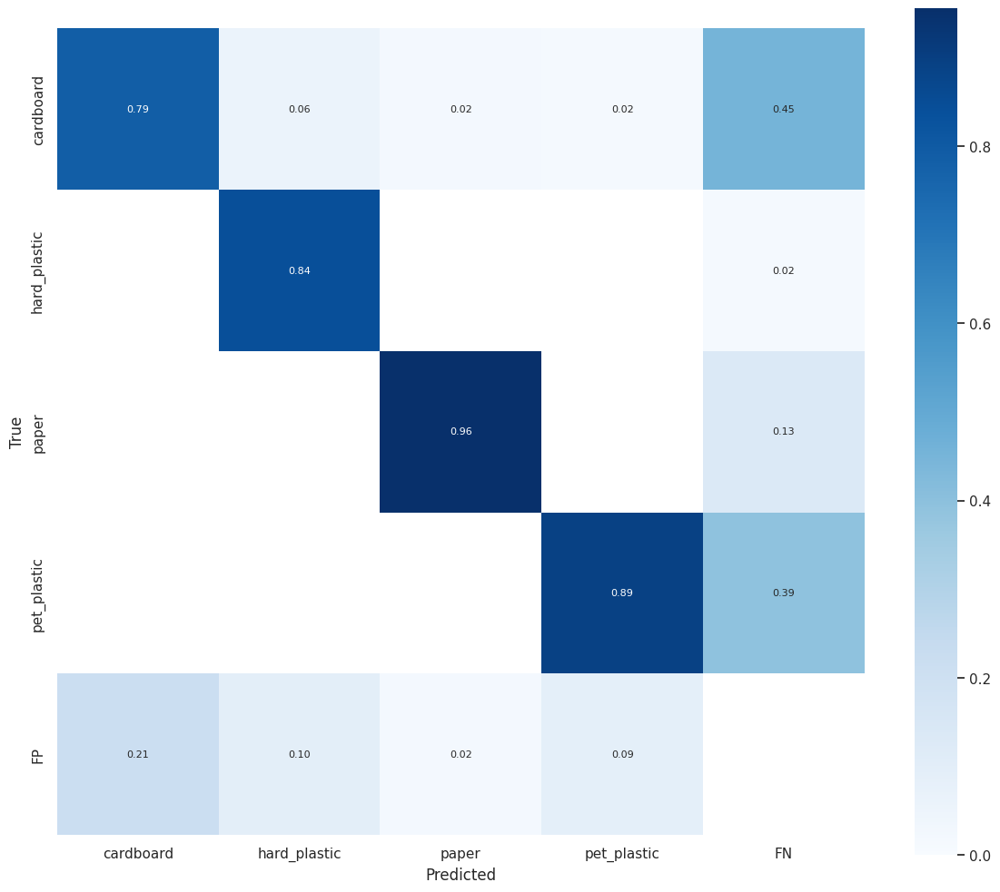

In [ ]:
import os
import numpy as np
from onemetric.cv.object_detection import ConfusionMatrix

HOME = '/content'

CONFIDENCE_THRESHOLD = 0.7

annotation_batches, prediction_batches = [], []

for path, image, annotation in ds:
    if not np.all((annotation.class_id >= 0) & (annotation.class_id < 4)):
        print(f"Advertencia: Hay clases fuera del rango esperado en las anotaciones: {annotation.class_id}")

    annotation_batch = np.column_stack((annotation.xyxy, annotation.class_id))
    annotation_batches.append(annotation_batch)

    preds = predictions.get(path, sv.Detections(xyxy=np.empty((0, 4)), class_id=np.empty((0,)), confidence=np.empty((0,))))  # Inicializa con arrays vacíos

    if not np.all((preds.class_id >= 0) & (preds.class_id < 4)):
        print(f"Advertencia: Hay clases fuera del rango esperado en las predicciones: {preds.class_id}")

    if preds.xyxy.size > 0:
        prediction_batch = np.column_stack((preds.xyxy, preds.class_id, preds.confidence))
    else:
        prediction_batch = np.empty((0, 6))

    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_THRESHOLD,
    iou_threshold=0.7
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

cm = confusion_matrix.matrix

# Calcular TP, FP, FN y TN para cada clase
TP = np.diag(cm)
FP = np.sum(cm, axis=0) - TN
FN = np.sum(cm, axis=1) - TN


TN = np.sum(cm) - (FP + FN + TP)

for i in range(confusion_matrix.num_classes):
    print(f"Clase {i}:")
    print(f"  Verdaderos Positivos (TP): {TP[i]}")
    print(f"  Verdaderos Negativos (TN): {TN[i]}")
    print(f"  Falsos Positivos (FP): {FP[i]}")
    print(f"  Falsos Negativos (FN): {FN[i]}")
    print(f"  Precisión: {TP[i] / (TP[i] + FP[i]) if (TP[i] + FP[i]) > 0 else 0:.4f}")
    print(f"  Recall: {TP[i] / (TP[i] + FN[i]) if (TP[i] + FN[i]) > 0 else 0:.4f}")
    print(f"  F1 Score: {2 * TP[i] / (2 * TP[i] + FP[i] + FN[i]) if (2 * TP[i] + FP[i] + FN[i]) > 0 else 0:.4f}")
    print()

def calculate_map(confusion_matrix: np.ndarray):
    APs = []
    for i in range(confusion_matrix.shape[0]):  e
        FP_class = np.sum(confusion_matrix[i, :]) - TN[i]
        FN_class = np.sum(confusion_matrix[:, i]) - TN[i]
        TP_class = np.sum(cm) - (FP_class + FN_class + TN[i])

        precision = TP_class / (TP_class + FP_class) if (TP_class + FP_class) > 0 else 0
        recall = TP_class / (TP_class + FN_class) if (TP_class + FN_class) > 0 else 0
        AP = precision * recall / (precision + recall) if (precision + recall) > 0 else 0
        APs.append(AP)

    return np.mean(APs)

mAP = calculate_map(cm)
print(f"mAP (Mean Average Precision): {mAP:.4f}")


Processing image: /content/HuYOLO-NAS-6/test/images/2023-11-04_14-15-14_jpg.rf.3580840e25053b0ef2e33a62246776bd.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231203_030_jpg.rf.3033329df580648c35dc3ecb0dd44f4e.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231146_014_jpg.rf.ecd388784af573cbe94ba9c224c50f18.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/0zGWBW_2_png_jpg.rf.53accc7b3102eb5dca9228e7baa62483.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/4gz38c_4_png_jpg.rf.c86bed4f067b102005f0dab418b38b0c.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231503_002_jpg.rf.430b7c95112726b87d067e15653a853d.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/8_jpg.rf.3e06a99b285e2d328c1f27e35b89854d.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-

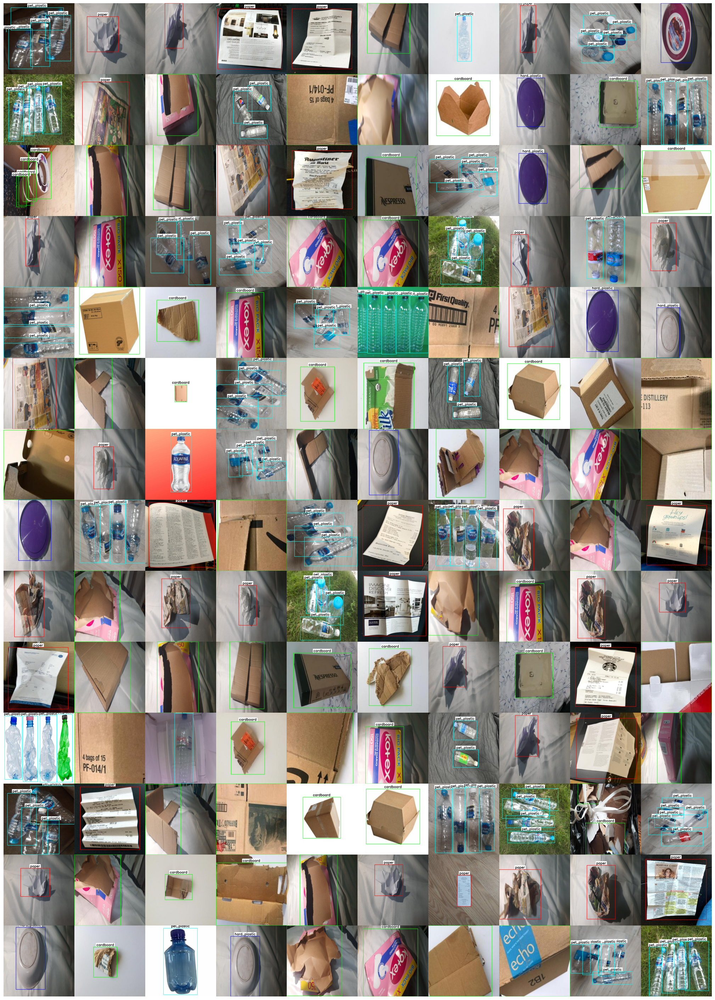

In [ ]:
import glob
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

image_folder = "/content/HuYOLO-NAS-10/test/images"
image_paths = glob.glob(os.path.join(image_folder, "*.jpg"))

indices = np.random.choice(len(image_paths), size=min(100, len(image_paths)), replace=False)

images = []

for idx in indices:
    path = image_paths[idx]
    image = cv2.imread(path)

    if image is not None and image.size > 0:
        height, width = image.shape[:2]
        label_path = os.path.join("/content/HuYOLO-NAS-6/test/labels", os.path.splitext(os.path.basename(path))[0] + ".txt")
        boxes, class_ids = load_labels(label_path)

        boxes = clip_coordinates(np.array(boxes), width, height)

        frame_with_predictions = image.copy()
        for box, class_id in zip(boxes, class_ids):
            x_min, y_min, x_max, y_max = box
            label = class_labels.get(class_id, 'Unknown')
            box_color = box_colors.get(class_id, (0, 255, 255))

            cv2.rectangle(frame_with_predictions, (int(x_min), int(y_min)), (int(x_max), int(y_max)), box_color, 2)

            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            text_x = int((x_min + x_max - text_size[0]) / 2)
            text_y = int(y_min - 10)

            cv2.rectangle(frame_with_predictions, (text_x - 5, text_y - text_size[1] - 5),
                          (text_x + text_size[0] + 5, text_y + 5), (255, 255, 255), -1)

            cv2.putText(frame_with_predictions, label, (text_x, text_y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2, cv2.LINE_AA)

        images.append(frame_with_predictions)

fig, axes = plt.subplots(nrows=14, ncols=10, figsize=(20, 28))
axes = axes.flatten()

for img, ax in zip(images, axes):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

for ax in axes[len(images):]:
    ax.axis('off')

plt.tight_layout(pad=0)
plt.show()

Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231620_003_jpg.rf.18c074218d8b9f02ab2765a4973a6d12.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231314_013_jpg.rf.1dfc794a80f3cab3e4bb81b0a63e83a1.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/Carton_565-copia_jpg.rf.f7bc1e8c4e3c2f232f1fe22653df2fdc.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231146_001_jpg.rf.9b6a5f7a011b4e28d3cd07748da52175.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/20241005_231635_016_jpg.rf.83c89d3903c3be3060729a178f7c50d2.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/2023-11-04_14-15-12_jpg.rf.d4d5e22428209eef22be9f39d3d9a9d4.jpg
Image dimensions: 640x640
Processing image: /content/HuYOLO-NAS-6/test/images/2023-11-04_14-07-02_0002_jpg.rf.aab399cd02d815aff17efcb23f9fe83d.jpg
Image dimensions: 640x640
Proc

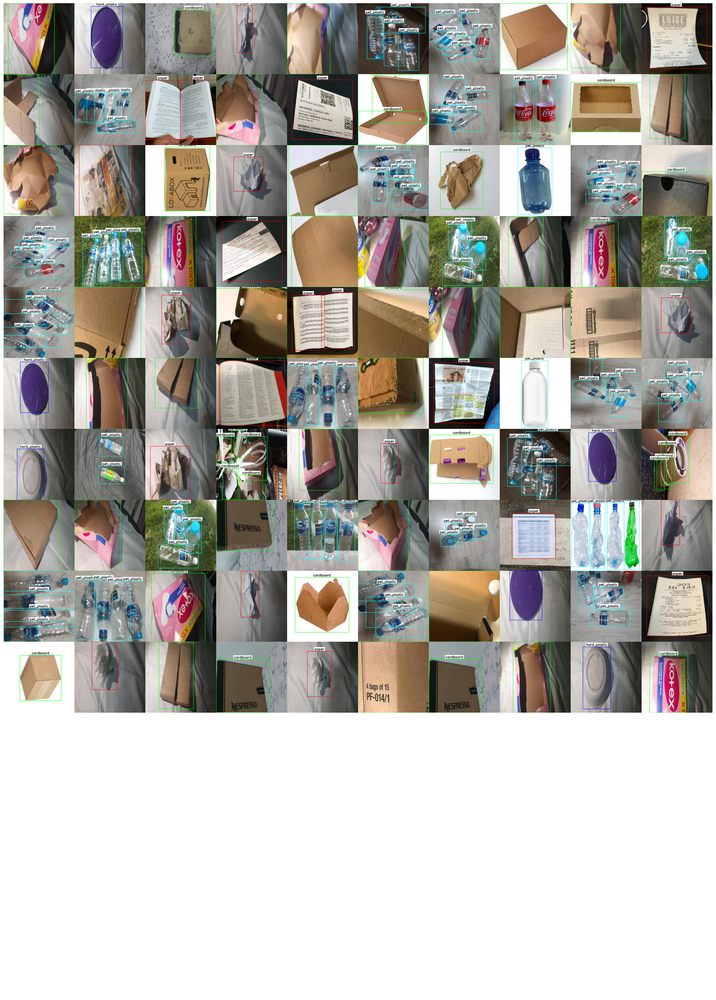

In [ ]:
import glob
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

image_folder = "/content/HuYOLO-NAS-10/test/images"
image_paths = glob.glob(os.path.join(image_folder, "*.jpg"))

indices = np.random.choice(len(image_paths), size=min(100, len(image_paths)), replace=False)

images = []

for idx in indices:
    path = image_paths[idx]
    image = cv2.imread(path)

    if image is not None and image.size > 0:
        height, width = image.shape[:2]
        label_path = os.path.join("/content/HuYOLO-NAS-6/test/labels", os.path.splitext(os.path.basename(path))[0] + ".txt")
        boxes, class_ids = load_labels(label_path)

        boxes = clip_coordinates(np.array(boxes), width, height)

        frame_with_predictions = image.copy()
        for box, class_id in zip(boxes, class_ids):
            x_min, y_min, x_max, y_max = box
            label = class_labels.get(class_id, 'Unknown')
            box_color = box_colors.get(class_id, (0, 255, 255))

            cv2.rectangle(frame_with_predictions, (int(x_min), int(y_min)), (int(x_max), int(y_max)), box_color, 2)

            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            text_x = int((x_min + x_max - text_size[0]) / 2)
            text_y = int(y_min - 10)

            cv2.rectangle(frame_with_predictions, (text_x - 5, text_y - text_size[1] - 5),
                          (text_x + text_size[0] + 5, text_y + 5), (255, 255, 255), -1)

            cv2.putText(frame_with_predictions, label, (text_x, text_y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2, cv2.LINE_AA)

        images.append(frame_with_predictions)

fig, axes = plt.subplots(nrows=14, ncols=10, figsize=(20, 28))
axes = axes.flatten()

for img, ax in zip(images, axes):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

for ax in axes[len(images):]:
    ax.axis('off')

plt.tight_layout(pad=0)
plt.show()


#**Paso 19: Descargar los vídeos de demostración**

In [ ]:
!gdown 'https://drive.google.com/uc?export=download&id=1d0BT4KQk1BJaKPpSTUI9n4FUfkT-k-9_' -O video1.mp4

Downloading...
From: https://drive.google.com/uc?export=download&id=1d0BT4KQk1BJaKPpSTUI9n4FUfkT-k-9_
To: /content/video1.mp4
100% 23.7M/23.7M [00:00<00:00, 115MB/s] 


In [ ]:
!gdown "https://drive.google.com/file/d/1UybQeIRUThFR7TjWTIIjGshUfnYcgbLY/view?usp=sharing" -O video2.mp4

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=1UybQeIRUThFR7TjWTIIjGshUfnYcgbLY
  warnings.warn(


#**Paso 20: Pruebas en el vídeo**




In [ ]:
input_video_path = f"/content/video1.mp4"
output_video_path = "detections01.mp4"

In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [ ]:
best_model.to(device).predict(input_video_path).save(output_video_path)

Processing Video:  99%|█████████▉| 2387/2400 [01:22<00:00, 35.77it/s]

#**Paso 21: Rendimiento en diferentes dimensiones del dataset**

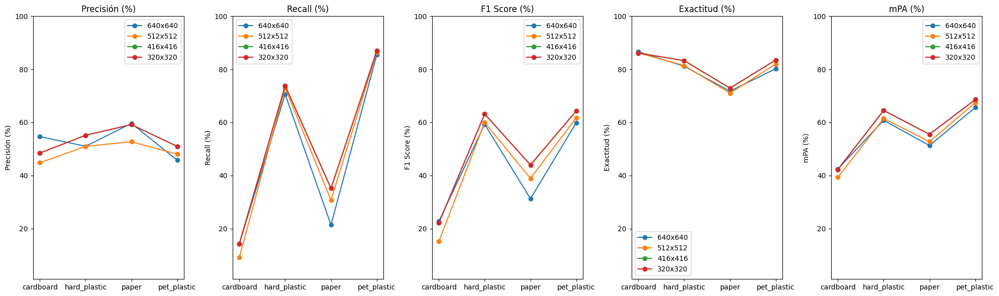

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Datos extraidos de la experimentación en otros cuaderno de Colab
resolutions = ['640x640', '512x512', '416x416', '320x320']
classes = ['cardboard', 'hard_plastic', 'paper', 'pet_plastic']
precision = [
    [54.65, 51.01, 59.62, 45.73],  # 640x640
    [44.78, 50.98, 52.72, 48.02],  # 512x512
    [48.45, 55.16, 59.16, 50.94],  # 416x416
    [48.45, 55.16, 59.16, 50.94]   # 320x320
]
recall = [
    [14.33, 70.62, 21.38, 85.51],  # 640x640
    [9.15, 72.99, 30.76, 86.49],   # 512x512
    [14.33, 73.84, 35.17, 86.94],  # 416x416
    [14.33, 73.84, 35.17, 86.94]   # 320x320
]
f1_score = [
    [22.72, 59.29, 31.27, 59.89],  # 640x640
    [15.11, 59.96, 38.90, 61.74],  # 512x512
    [22.14, 63.16, 43.98, 64.35],  # 416x416
    [22.14, 63.16, 43.98, 64.35]   # 320x320
]
accuracy = [
    [86.61, 81.16, 71.75, 80.24],  # 640x640
    [86.17, 81.43, 71.03, 82.01],  # 512x512
    [86.12, 83.27, 72.91, 83.52],  # 416x416
    [86.12, 83.27, 72.91, 83.52]   # 320x320
]
mPA = [
    [42.46, 60.81, 51.28, 65.62],  # 640x640
    [39.32, 61.48, 52.74, 67.43],  # 512x512
    [42.29, 64.50, 55.52, 68.61],  # 416x416
    [42.29, 64.50, 55.52, 68.61]   # 320x320
]

fig, axs = plt.subplots(1, 5, figsize=(20, 6))

metrics = [precision, recall, f1_score, accuracy, mPA]
metric_titles = ["Precisión (%)", "Recall (%)", "F1 Score (%)", "Exactitud (%)", "mPA (%)"]

# Graficar las métricas
for i, metric_data in enumerate(metrics):
    ax = axs[i]
    ax.set_title(metric_titles[i])

    for j, resolution in enumerate(resolutions):
        ax.plot(classes, metric_data[j], label=resolution, marker='o')

    ax.set_ylabel(metric_titles[i])
    ax.set_ylim(1, 100)
    ax.legend()

plt.tight_layout()
plt.show()
